In [1]:
import pandas as pd
import pandas_profiling as pp 
import numpy as np
import sklearn 
from sklearn.datasets import load_boston
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import warnings
warnings.filterwarnings('ignore')
np.random.seed(23)

In [2]:
fires_df = pd.read_csv('forest_fires_dataset.csv')
fires_df

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51.0,6.7,0.0,0.00
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33.0,0.9,0.0,0.00
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33.0,1.3,0.0,0.00
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97.0,4.0,0.2,0.00
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99.0,1.8,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,4,3,aug,sun,81.6,56.7,665.6,1.9,27.8,32.0,2.7,0.0,6.44
513,2,4,aug,sun,81.6,56.7,665.6,1.9,21.9,71.0,5.8,0.0,54.29
514,7,4,aug,sun,81.6,56.7,665.6,1.9,21.2,70.0,6.7,0.0,11.16
515,1,4,aug,sat,94.4,146.0,614.7,11.3,25.6,42.0,4.0,0.0,0.00


In [3]:
fires_df.info()
#Nie ma brakujących wartości

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   X       517 non-null    int64  
 1   Y       517 non-null    int64  
 2   month   517 non-null    object 
 3   day     517 non-null    object 
 4   FFMC    517 non-null    float64
 5   DMC     517 non-null    float64
 6   DC      517 non-null    float64
 7   ISI     517 non-null    float64
 8   temp    517 non-null    float64
 9   RH      517 non-null    float64
 10  wind    517 non-null    float64
 11  rain    517 non-null    float64
 12  area    517 non-null    float64
dtypes: float64(9), int64(2), object(2)
memory usage: 48.5+ KB


In [4]:
fires_df.describe()
#DC ma dużą wariancję

,X,Y,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
count,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000
mean,4.669246,4.299807,90.644681,110.872340,547.940039,9.021663,18.889168,44.288201,4.017602,0.021663,12.847292
std,2.313778,1.229900,5.520111,64.046482,248.066192,4.559477,5.806625,16.317469,1.791653,0.295959,63.655818
min,1.000000,2.000000,18.700000,1.100000,7.900000,0.000000,2.200000,15.000000,0.400000,0.000000,0.000000
25%,3.000000,4.000000,90.200000,68.600000,437.700000,6.500000,15.500000,33.000000,2.700000,0.000000,0.000000
50%,4.000000,4.000000,91.600000,108.300000,664.200000,8.400000,19.300000,42.000000,4.000000,0.000000,0.520000
75%,7.000000,5.000000,92.900000,142.400000,713.900000,10.800000,22.800000,53.000000,4.900000,0.000000,6.570000
max,9.000000,9.000000,96.200000,291.300000,860.600000,56.100000,33.300000,100.000000,9.400000,6.400000,1090.840000


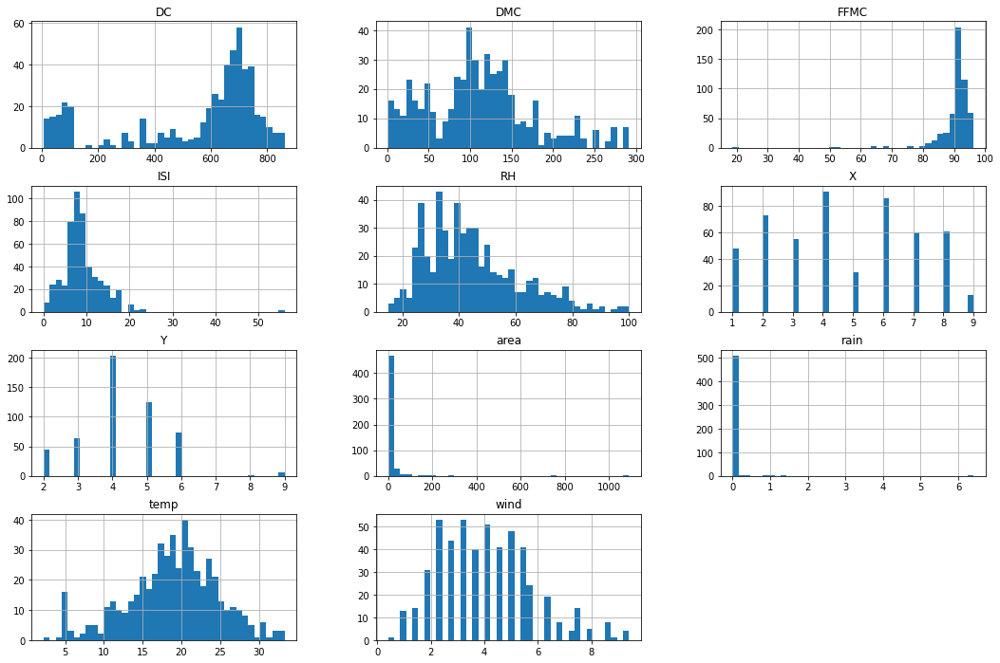

In [5]:
fires_df.hist(bins = 40, figsize=(18, 12))
plt.show()
#ISI, RH, temp, wind bliskie rozkładowi normalnemu
#rain, area w większości wartości bliskie 0

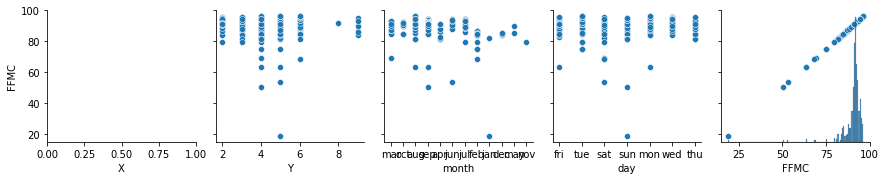

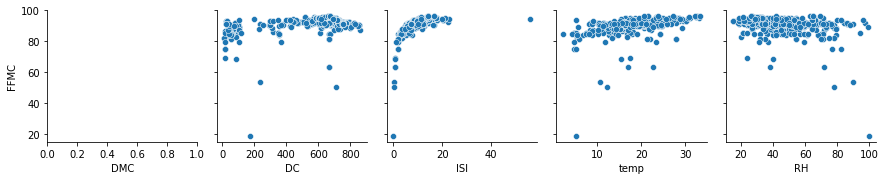

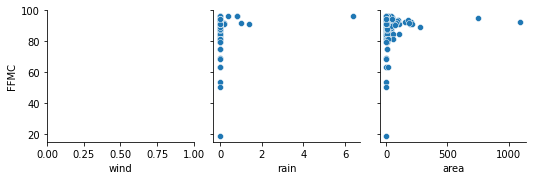

In [6]:
sns.pairplot(fires_df, y_vars="FFMC", x_vars=fires_df.columns.values[:5])
sns.pairplot(fires_df, y_vars="FFMC", x_vars=fires_df.columns.values[5:10])
sns.pairplot(fires_df, y_vars="FFMC", x_vars=fires_df.columns.values[10:])
#zależność FFMC i ISI

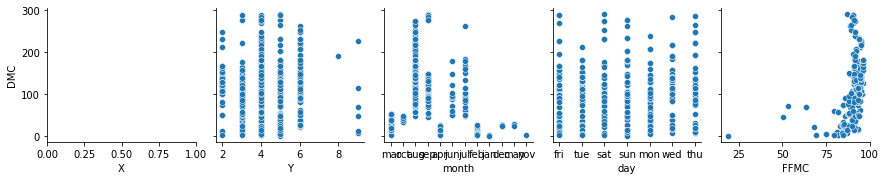

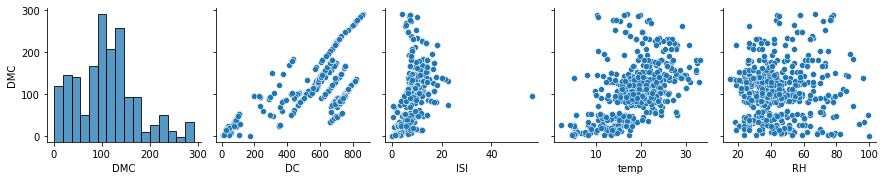

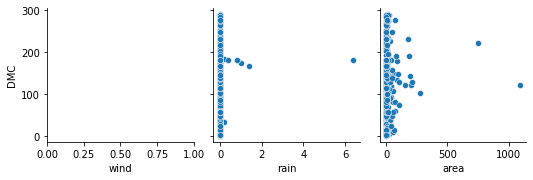

In [7]:
sns.pairplot(fires_df, y_vars="DMC", x_vars=fires_df.columns.values[:5])
sns.pairplot(fires_df, y_vars="DMC", x_vars=fires_df.columns.values[5:10])
sns.pairplot(fires_df, y_vars="DMC", x_vars=fires_df.columns.values[10:])
#silna zależność DMC i DC i lekka DMC i ISI

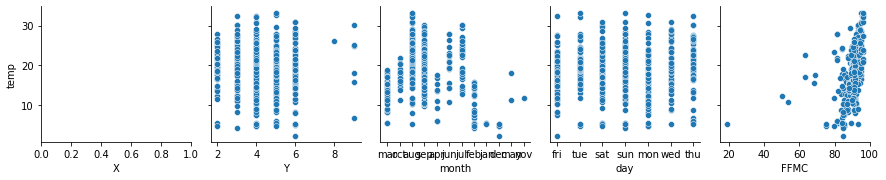

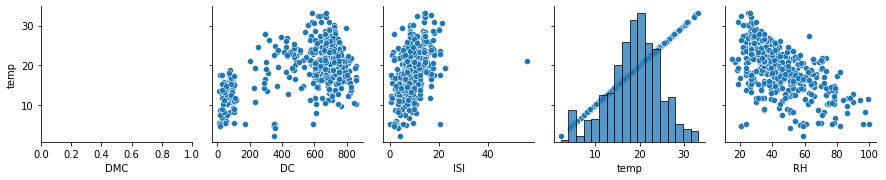

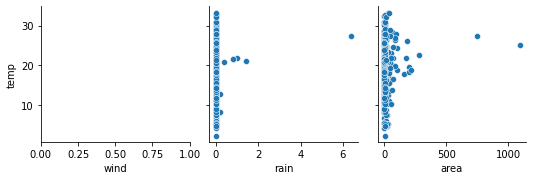

In [8]:
sns.pairplot(fires_df, y_vars="temp", x_vars=fires_df.columns.values[:5])
sns.pairplot(fires_df, y_vars="temp", x_vars=fires_df.columns.values[5:10])
sns.pairplot(fires_df, y_vars="temp", x_vars=fires_df.columns.values[10:])
#zależność temp i RH

<AxesSubplot:xlabel='month', ylabel='count'>

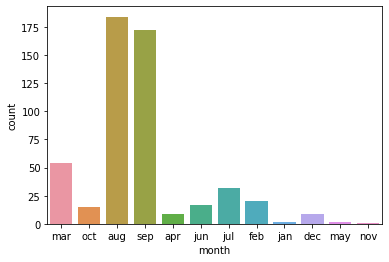

In [9]:
sns.countplot(x="month", data=fires_df)
#sierpień i wrzesień to sezon pożarowy

<AxesSubplot:xlabel='day', ylabel='count'>

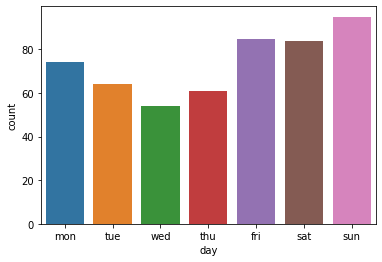

In [10]:
sns.countplot(x="day", data=fires_df, order=["mon","tue","wed","thu","fri","sat","sun"])
#najwięcej pożarów w okolicach weekendu

In [11]:
pp.ProfileReport(fires_df)
#dane mają 4 zduplikowane rekordy

#największą wadą jest długi czas potrzebny na wygenerowanie raportu z dużej ilości danych
#dużo informacji, które mogą nas nie interesować

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]